# Nội dung Mini-Challenge
- Đầu vào: Một bức ảnh chụp lớp học.
- Đầu ra: Phát hiện các khuôn mặt trong ảnh và nhận diện các khuôn mặt phát hiện được.
- Ảnh dữ liệu: Bên trong thư mục FaceDB là danh sách các thư mục có đặc điểm:
    + Tên thư mục là định danh (label) của một người.
    + Bên trong thư mục là các ảnh khuôn mặt của người đó.

# Các bước thực hiện
- Lấy ra các khuôn mặt và nhãn từ tập dữ liệu.
- Sử dụng pre-train model để đặc tả ảnh khuôn mặt thành một vector có 128 chiều.
- Huấn luyện bộ nhận diện khuôn mặt dựa trên các vector đặc tả thu được từ các ảnh khuôn mặt, sử dụng hai mô hình máy học của bộ thư viện scikit-learn: Support Vector Model (SVM) và K-Nearest Neighbors (KNN).
- Dùng hai bộ nhận diện đã được huấn luyện để nhận diện khuôn mặt trong bức ảnh được đưa vào.

In [2]:
import os
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
from sklearn.preprocessing import LabelEncoder

# Load pre-trained Torch-based model responsibled for extracting facial embeddings via deep learning feature extraction
embedder = cv.dnn.readNetFromTorch('openface.nn4.small2.v1.t7')
# Load face detector model
detector = cv.CascadeClassifier('haarcascade_frontalface_default.xml')

### Lấy ra các ảnh huấn luyện và nhãn của ảnh
    (Chỉ lấy các file có đuôi jpg)

In [3]:
# Đường dẫn thư mục FaceDB
db_path = os.path.join(os.getcwd(), 'FaceDB')

# Tập tên các thư mục con của FaceDB, cũng là nhãn của ảnh
db_labels = [lb for lb in os.listdir(db_path) if os.path.isdir(os.path.join(db_path, lb))]

# Danh sách lưu các cặp <nhãn của ảnh, đường dẫn của ảnh>
label_file_list = []

for label in db_labels:
    db_sub_path = os.path.join(db_path, label)
    # Lấy các ảnh 
    file_list = [i for i in os.listdir(db_sub_path) if i.endswith('.jpg')]
    for f in file_list:
        label_file_list.append([label, os.path.join(db_sub_path, f)])
        
print('[Có ',len(label_file_list),' ảnh huấn luyện]')

[Có  56  ảnh huấn luyện]


### Đặc tả ảnh khuôn mặt
Sử dụng pre-train model openface_nn4.small2.v1.t7 - một mô hình deep learning của Torch - để đặc tả ảnh khuôn mặt.

Mô hình Haar Cascade được dùng để phát hiện khuôn mặt trong ảnh.

Các vector đặc trưng cho khuôn mặt sau khi rút ra được lưu vào knownEmbeddings.

Các nhãn tương ứng cho vector được lưu vào knownNames.

In [10]:
# embedder = cv.dnn.readNetFromTorch('openface.nn4.small2.v1.t7')
# detector = cv.CascadeClassifier('haarcascade_frontalface_default.xml')

knownEmbeddings = []
knownNames = []

for i in label_file_list:
    img = cv.imread(i[1])
    
    gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
    faces = detector.detectMultiScale(gray, 1.3, 5)
    if len(faces) == 0:
        face_img = img
    else:        
        [x,y,w,h] = faces[0]
        face_img = img[y:y+h, x:x+w]
    
    # Tạo blob là bước tiền xử lý cho dnn của OpenCV
    faceBlob = cv.dnn.blobFromImage(face_img, 1.0 / 255,(96, 96), (0, 0, 0), swapRB=True, crop=False)
    # Thực hiện embedding - đặc tả khuôn mặt:
    embedder.setInput(faceBlob)
    vec = embedder.forward()
    
    knownNames.append(i[0])
    knownEmbeddings.append(vec.flatten())

### Huấn luyện bộ nhận diện
Sử dụng Support Vector Model của thư viện scikit-learn:

In [11]:
from sklearn.svm import SVC

print('[Đang huấn luyện mô hình...]')

svm_le = LabelEncoder()
svm_labels = svm_le.fit_transform(knownNames)

svm_recognizer = SVC(C=1.0, kernel="linear", probability=True)
svm_recognizer.fit(knownEmbeddings, svm_labels)

print('[Kết thúc]')

[Đang huấn luyện mô hình...]
[Kết thúc]


Sử dụng k-Nearest Neighbors của thư viện scikit-learn:

In [12]:
from sklearn.neighbors import KNeighborsClassifier

print('[Đang huấn luyện mô hình...]')

knn_le = LabelEncoder()
knn_labels = knn_le.fit_transform(knownNames)

knn_recognizer = KNeighborsClassifier(n_neighbors=1, algorithm='ball_tree', weights='distance')
knn_recognizer.fit(knownEmbeddings, knn_labels)

print('[Kết thúc]')

[Đang huấn luyện mô hình...]
[Kết thúc]


### Thực hiện nhận diện khuôn mặt

Lần lượt thực hiện nhận diện trên từng ảnh đầu vào bằng mô hình SVM và KNN đã huấn luyện.

[Nhận diện ảnh thứ:  1 ...]
[Sử dụng SVM:]


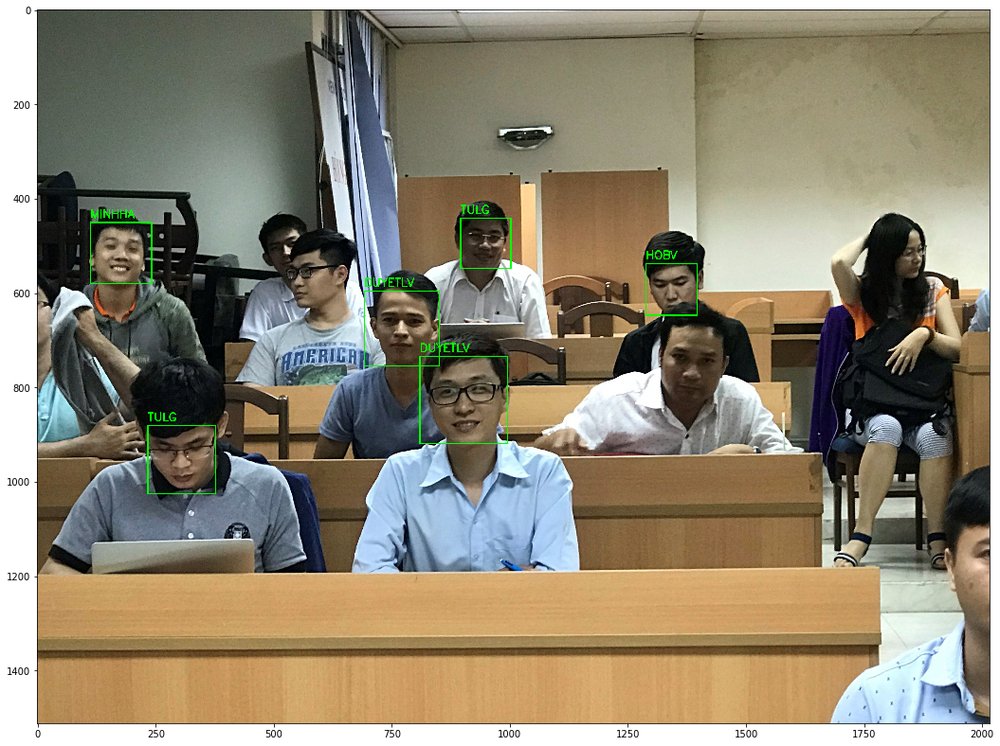

[Sử dụng KNN:]


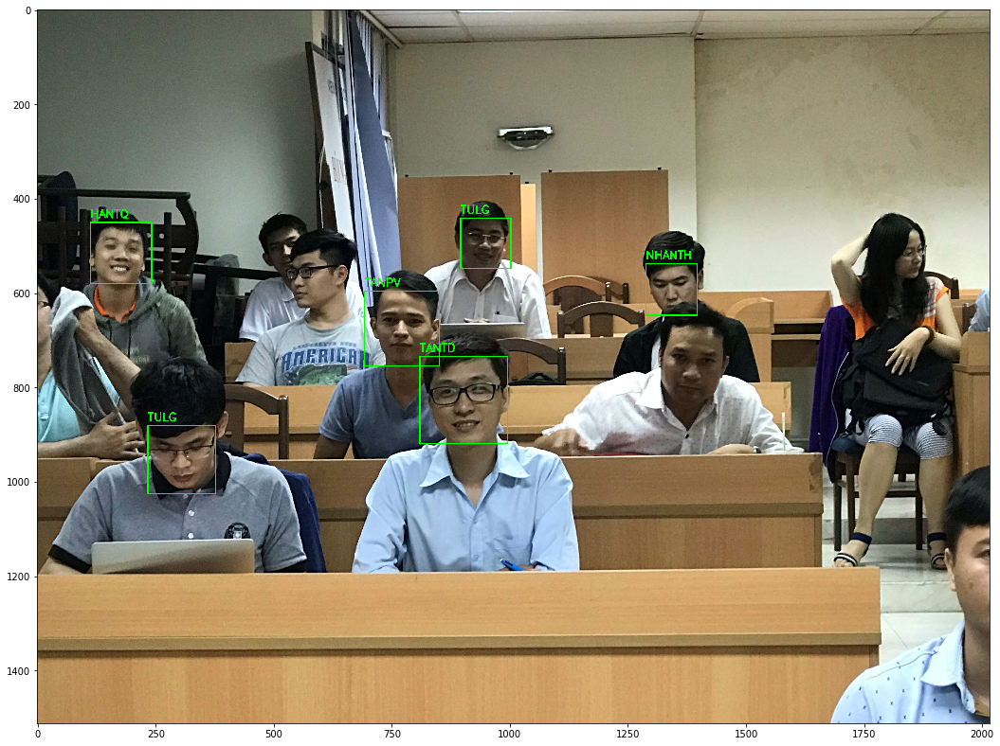

[Nhận diện ảnh thứ:  2 ...]
[Sử dụng SVM:]


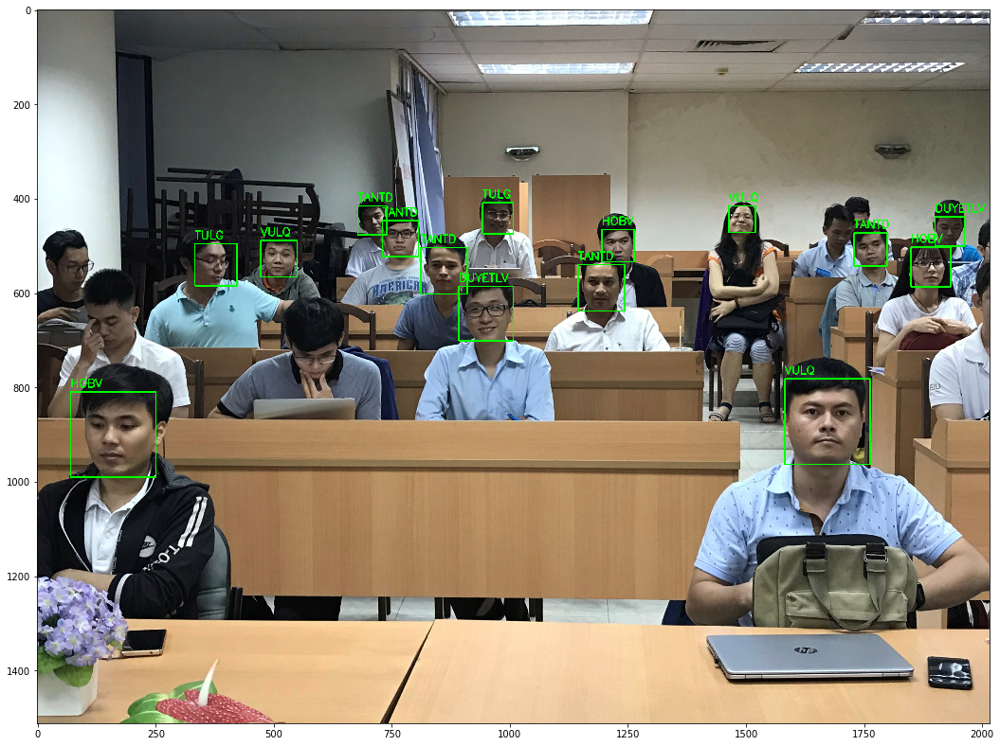

[Sử dụng KNN:]


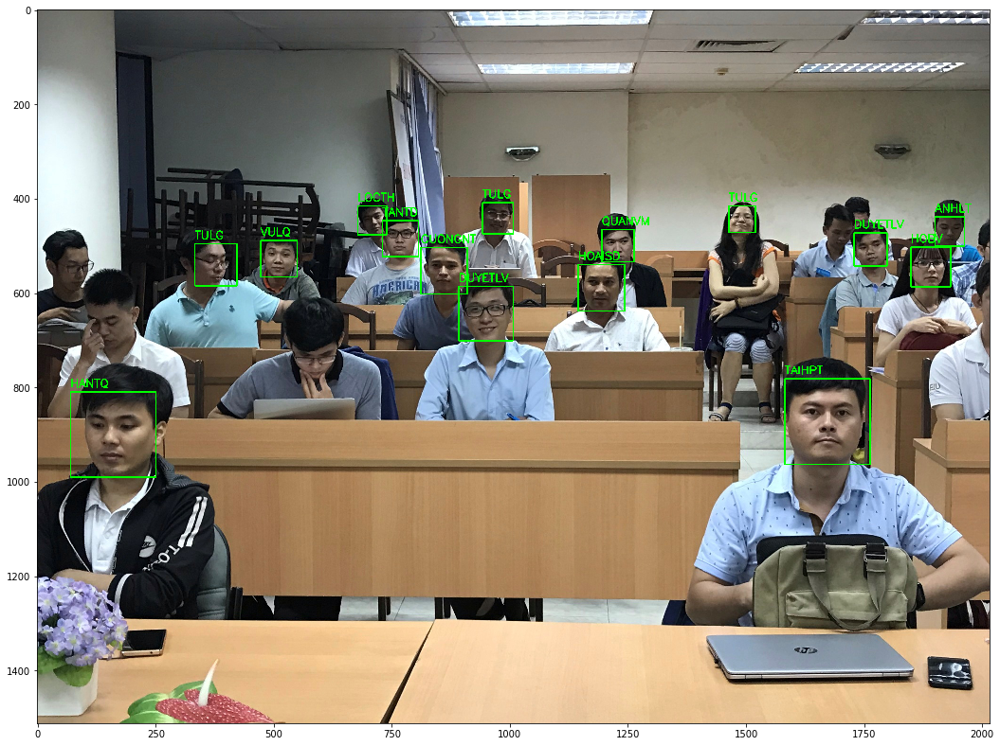

[Nhận diện ảnh thứ:  3 ...]
[Sử dụng SVM:]


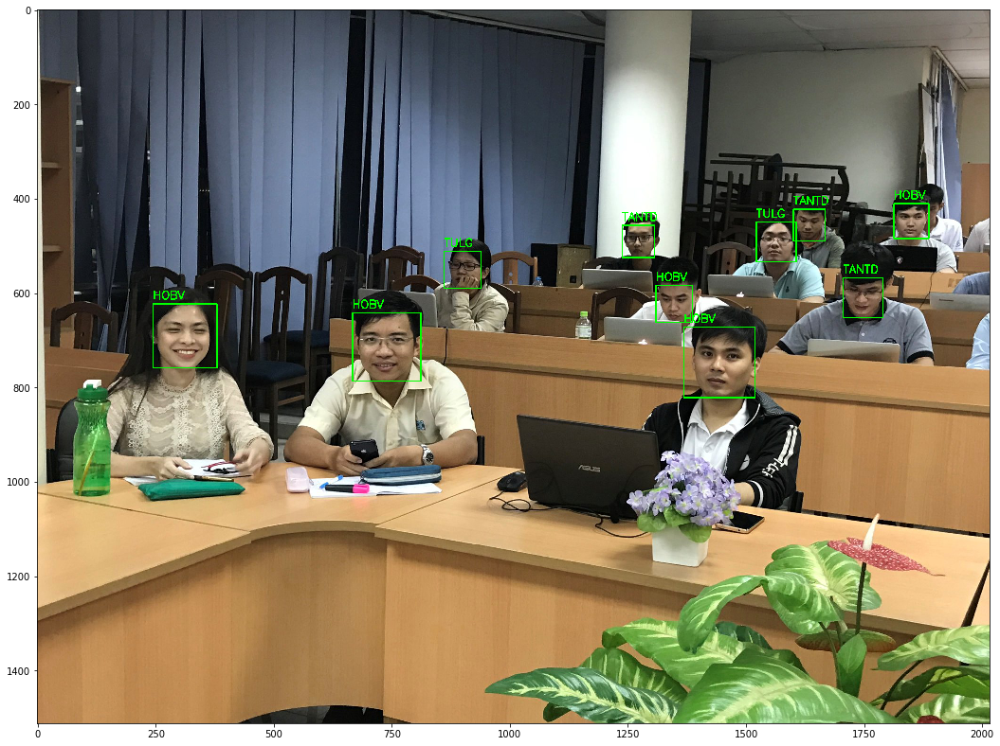

[Sử dụng KNN:]


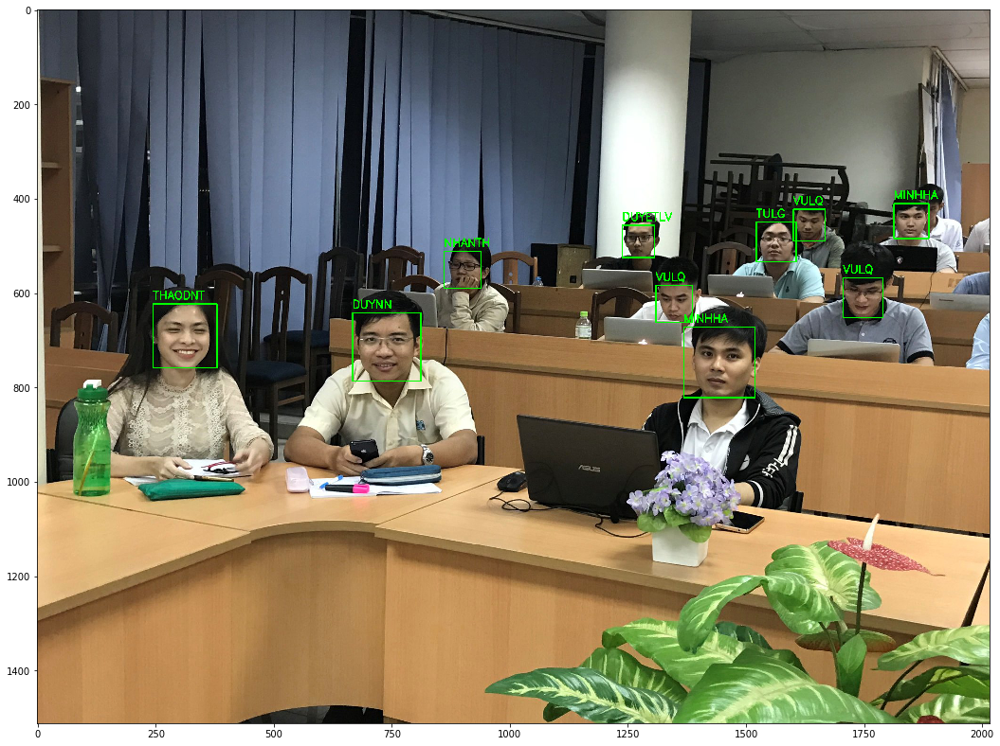

[Nhận diện ảnh thứ:  4 ...]
[Sử dụng SVM:]


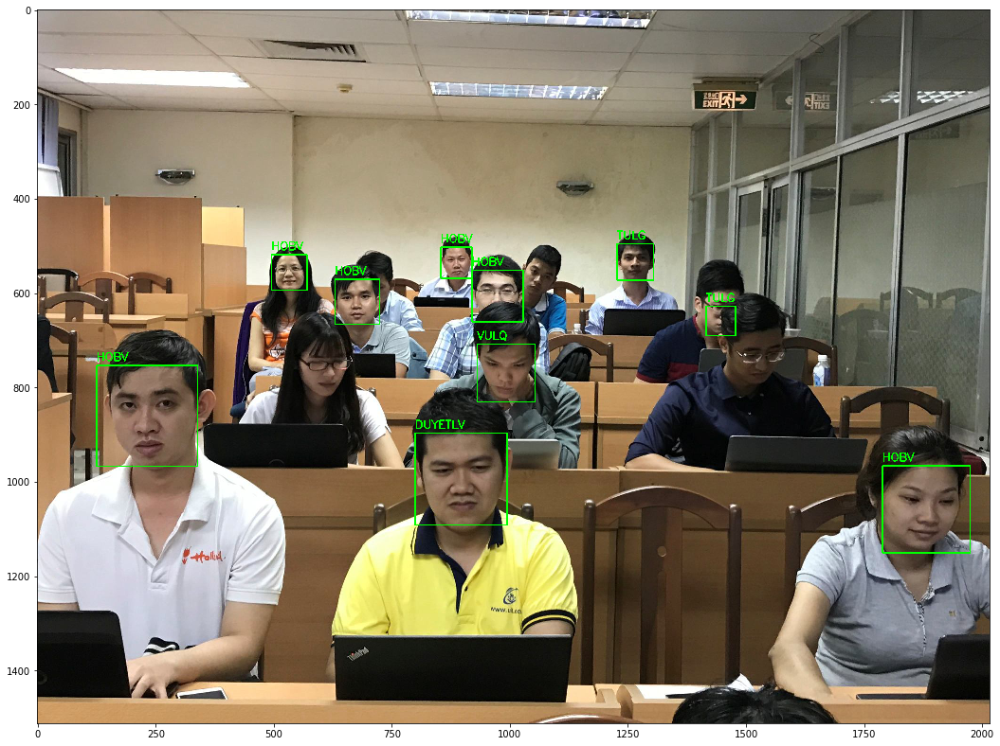

[Sử dụng KNN:]


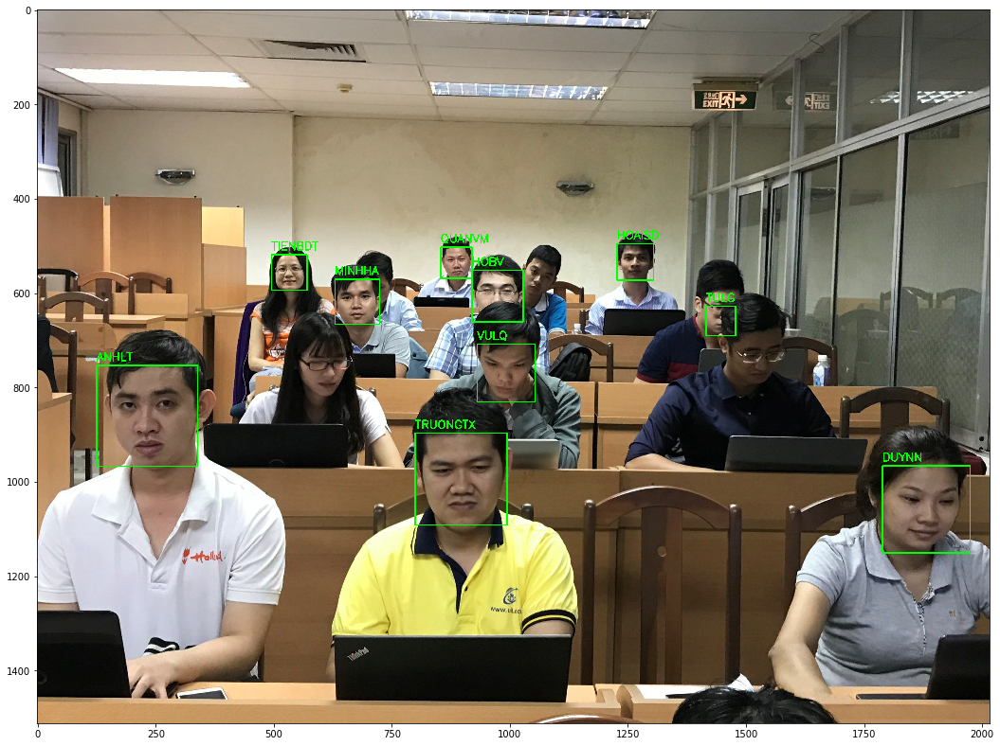

[Kết thúc]


In [18]:
# Đường dẫn thư mục ảnh đầu vào
test_path = os.path.join(os.getcwd(), 'TestImages')
test_img_dir = [os.path.join(test_path, f) for f in os.listdir(test_path) if f.endswith('.jpg')]

plt.rcParams['figure.figsize'] = [18, 18]

count = 0

for i in test_img_dir:
    count += 1    
    print('[Nhận diện ảnh thứ: ',count,'...]')
    
    img = cv.imread(i)
    gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)
    faces = detector.detectMultiScale(gray, 1.1, 5)
    
    svm_img_show = img.copy()
    knn_img_show = img.copy()
    
    for (x,y,w,h) in faces:
        crop_img = img[y:y+h, x:x+w]
        
        faceBlob = cv.dnn.blobFromImage(crop_img, 1.0 / 255, (96, 96), (0, 0, 0), swapRB=True, crop=False)
        embedder.setInput(faceBlob)
        vec = embedder.forward()
        
        svm_pred = svm_recognizer.predict_proba(vec)[0]
        m = np.argmax(svm_pred)
        svm_name = svm_le.classes_[m]
        
        cv.rectangle(svm_img_show, (x,y), (x+w,y+h), (0,255,0), 2)
        text = "{}".format(svm_name)
        t = y - 10 if y - 10 > 10 else y + 10
        cv.putText(svm_img_show, text, (x, t), cv.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
        
        knn_pred = knn_recognizer.predict_proba(vec)[0]
        n = np.argmax(knn_pred)
        knn_name = knn_le.classes_[n]
        
        cv.rectangle(knn_img_show, (x,y), (x+w,y+h), (0,255,0), 2)
        text = "{}".format(knn_name)
        t = y - 10 if y - 10 > 10 else y + 10
        cv.putText(knn_img_show, text, (x, t), cv.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
        
    print('[Sử dụng SVM:]')
    im_cvt = cv.cvtColor(svm_img_show, cv.COLOR_BGR2RGB)
    plt.imshow(im_cvt)
    plt.show()
    print('[Sử dụng KNN:]')
    im_cvt = cv.cvtColor(knn_img_show, cv.COLOR_BGR2RGB)
    plt.imshow(im_cvt)
    plt.show()
print('[Kết thúc]')

# Kết quả & nhận xét


<img src="files/bang_ket_qua.png">

Kết quả nhận diện không tốt. Mô hình KNN nhận diện tốt hơn SVM ở cả bốn ảnh đầu vào, với ảnh thứ 2 và thứ 3 nhận diện được nhiều nhất là bốn người. Song với một số trường hợp như THAODNT, TRUONGTX, TIENBDT thì chỉ có một ảnh huấn luyện và ảnh huấn luyện cũng vốn là cắt từ ảnh thử, nên có thể không khách quan. Với mô hình SVM thì xét thấy các kết quả nhận diện, dù sai, đều hướng về những đối tượng có nhiều ảnh huấn luyện; nhãn của những đối tượng có rất ít ảnh huấn luyện (chỉ có từ một đến hai ảnh) thậm chí không có thì không thấy được định danh.
    
Từ tập ảnh huấn luyện ít, thiếu cân bằng (có đối tượng có 5-6 ảnh huấn luyện, có đối tượng có 1 ảnh hoặc không có), nhiều ảnh cũng khòe và tối nên có thể đã ảnh hưởng đến kết quả nhận dạng. Để cải thiện kết quả thì một bộ dữ liệu tốt hơn là cần thiết cũng như tìm hiểu và áp dụng các phương pháp nhận diện, các phương pháp xử lý dữ liệu tối ưu hơn.
    

#### Nguồn tham khảo
    https://www.pyimagesearch.com/2018/09/24/opencv-face-recognition/